In [18]:
!pip install  opencv-python==3.4.2.17
!pip install  opencv-contrib-python==3.4.2.17
import cv2 
import numpy as np
import matplotlib.pyplot as plt
import imageio
import imutils
cv2.ocl.setUseOpenCL(False)

# Pobranie plikow

In [19]:
import string
import requests

def pobierzPlik(url, nazwaPliku):
    req = requests.get(url, stream=True)
    with open(nazwaPliku, 'wb') as uchwytPliku:
        for chunk in req.iter_content():
            uchwytPliku.write(chunk)

nazwyPlikow = ['r01.jpg', 'r02.jpg', 'r03.jpg', 'r04.jpg', 'r05.jpg', 'r06.jpg', 'r07.jpg', 'r08.jpg', 'r09.jpg', 'r10.jpg', 'r11.jpg', 'r12.jpg']
for nazwa in nazwyPlikow:
  pobierzPlik("https://github.com/rroszczyk/1DI2243/raw/main/L1/"+nazwa, nazwa)    

# Funkcje pomocnicze

In [20]:
def detectAndDescribe(image, method=None):    
    assert method is not None, "You need to define a feature detection method. Values are: 'sift', 'surf'"
    
    # detect and extract features from the image
    if method == 'sift':
        descriptor = cv2.xfeatures2d.SIFT_create()
    elif method == 'surf':
        descriptor = cv2.xfeatures2d.SURF_create()
    elif method == 'brisk':
        descriptor = cv2.BRISK_create()
    elif method == 'orb':
        descriptor = cv2.ORB_create()
        
    # get keypoints and descriptors
    (kps, features) = descriptor.detectAndCompute(image, None)
    
    return (kps, features)

In [21]:
def createMatcher(method,crossCheck):
    "Create and return a Matcher Object"
    
    if method == 'sift' or method == 'surf':
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=crossCheck)
    elif method == 'orb' or method == 'brisk':
        bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=crossCheck)
    return bf

In [22]:
def matchKeyPointsKNN(featuresA, featuresB, ratio, method):
    bf = createMatcher(method, crossCheck=False)
    # compute the raw matches and initialize the list of actual matches
    rawMatches = bf.knnMatch(featuresA, featuresB, 2)
    print("Raw matches (knn):", len(rawMatches))
    matches = []

    # loop over the raw matches
    for m,n in rawMatches:
        # ensure the distance is within a certain ratio of each
        # other (i.e. Lowe's ratio test)
        if m.distance < n.distance * ratio:
            matches.append(m)

    return matches

In [23]:
def getHomography(kpsA, kpsB, featuresA, featuresB, matches, reprojThresh):
    # convert the keypoints to numpy arrays
    kpsA = np.float32([kp.pt for kp in kpsA])
    kpsB = np.float32([kp.pt for kp in kpsB])
    
    if len(matches) > 4:

        # construct the two sets of points
        ptsA = np.float32([kpsA[m.queryIdx] for m in matches])
        ptsB = np.float32([kpsB[m.trainIdx] for m in matches])
        
        # estimate the homography between the sets of points
        (H, status) = cv2.findHomography(ptsA, ptsB, cv2.RANSAC,
            reprojThresh)

        return (matches, H, status)
    else:
        return None

In [24]:
def ImageStitching_without_show(url1, url2):

  feature_extractor = 'sift' 
  feature_matching = 'knn'

  #--------------------------------------------------------------------------------------------------

  trainImg = cv2.imread(url1)
  trainImg_gray = cv2.cvtColor(trainImg, cv2.COLOR_RGB2GRAY)

  queryImg = cv2.imread(url2)
  queryImg_gray = cv2.cvtColor(queryImg, cv2.COLOR_RGB2GRAY)

  #------------------------------------------------------------------------------------------------

  kpsA, featuresA = detectAndDescribe(trainImg_gray, method=feature_extractor)
  kpsB, featuresB = detectAndDescribe(queryImg_gray, method=feature_extractor)

  #------------------------------------------------------------------------------------------------


  fig = plt.figure(figsize=(20,10))

  if feature_matching == 'knn':
      matches = matchKeyPointsKNN(featuresA, featuresB, ratio=0.65, method=feature_extractor)
      
      img3 = cv2.drawMatches(trainImg,kpsA,queryImg,kpsB,matches[:20],
                            None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
      
      # plt.imshow(img3)
      # plt.show()
      
  #------------------------------------------------------------------------------------------------------

  M = getHomography(kpsA, kpsB, featuresA, featuresB, matches, reprojThresh=4)

  if M is None:
      print("Error!")
  else:
    (matches, H, status) = M
    #print(H)

    # Apply panorama correction
    width = trainImg.shape[1] + queryImg.shape[1]
    height = trainImg.shape[0] + queryImg.shape[0]

    result = cv2.warpPerspective(trainImg, H, (width, height))
    
    # plt.figure(figsize=(20,10))
    # plt.title('Po warpie')
    # plt.imshow(result)
    # plt.show()

    #----------------------------------------------------------------------
    grayscale_image = cv2.cvtColor(result, cv2.COLOR_RGB2GRAY)
    cnts = cv2.findContours(grayscale_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]


    for c in cnts:
        x,y,w,h = cv2.boundingRect(c)
        ROI = result[y:y+h, x:x+w].copy()

    result[0:queryImg.shape[0], 0:queryImg.shape[1]] = queryImg
    result[y:y+h, x:x+w] = ROI

    # plt.figure(figsize=(20,10))
    # plt.title('ROI')
    # plt.imshow(ROI)
    # plt.show()

    #--------------------------------------------------------------------------------------------------

    # transform the panorama image to grayscale and threshold it 
    gray = cv2.cvtColor(result, cv2.COLOR_BGR2GRAY)
    thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)[1]

    # Finds contours from the binary image
    cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)

    # get the maximum contour area
    c = max(cnts, key=cv2.contourArea)

    # get a bbox from the contour area
    (x, y, w, h) = cv2.boundingRect(c)

    # crop the image to the bbox coordinates
    result = result[y:y + h, x:x + w]

    # show the cropped image

    plt.figure(figsize=(20,10))
    plt.title('Result full')
    plt.imshow(result)
    plt.show()

    #print(type(result))

    cv2.imwrite('result.jpg', result)
  return None

# Wywołanie funkcji, rezultat

In [25]:
lista = ['r01.jpg', 'r02.jpg', 'r03.jpg', 'r04.jpg', 'r05.jpg', 'r06.jpg', 'r07.jpg', 'r08.jpg', 'r09.jpg', 'r10.jpg', 'r11.jpg', 'r12.jpg']

Raw matches (knn): 5826


<Figure size 1440x720 with 0 Axes>

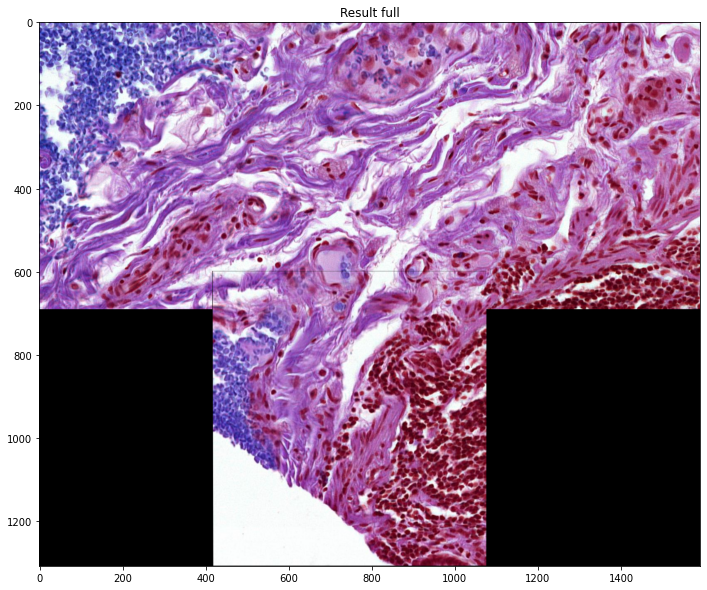

Raw matches (knn): 5826


<Figure size 1440x720 with 0 Axes>

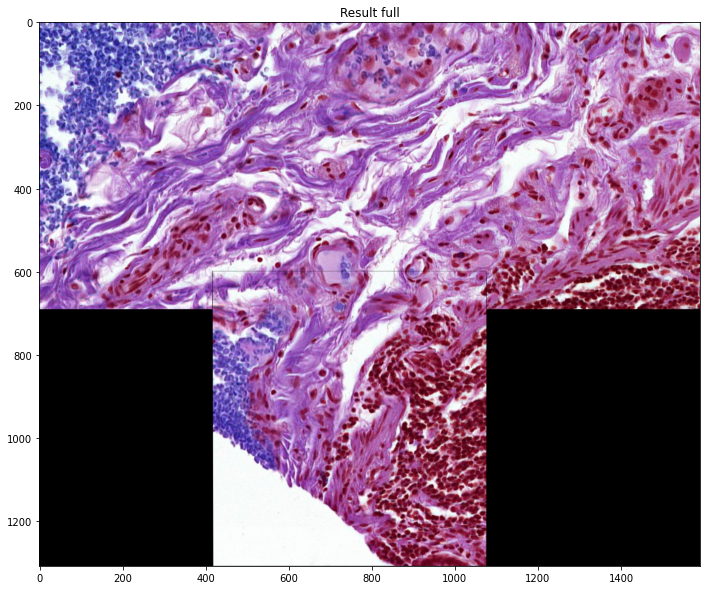

Raw matches (knn): 3797


<Figure size 1440x720 with 0 Axes>

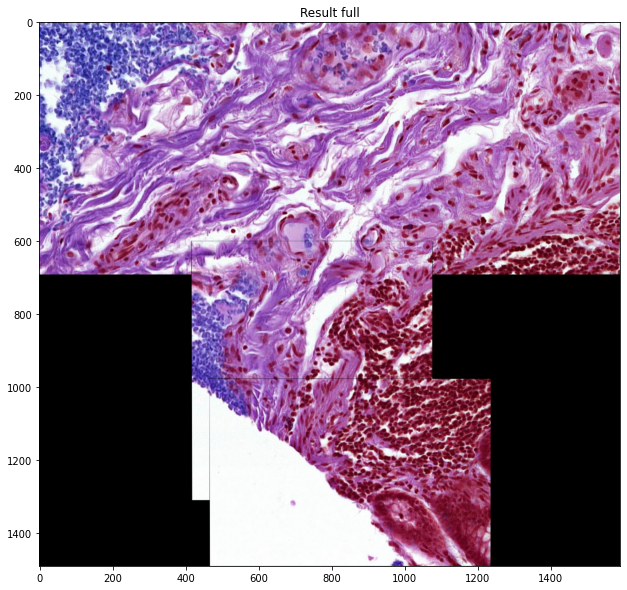

Raw matches (knn): 4429


<Figure size 1440x720 with 0 Axes>

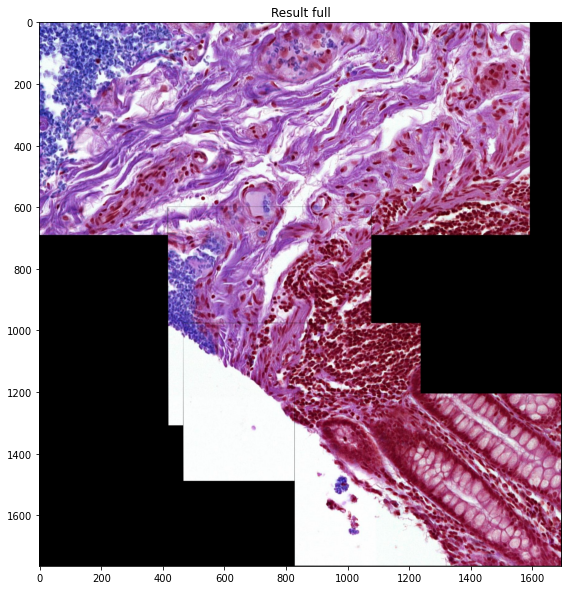

Raw matches (knn): 3393


<Figure size 1440x720 with 0 Axes>

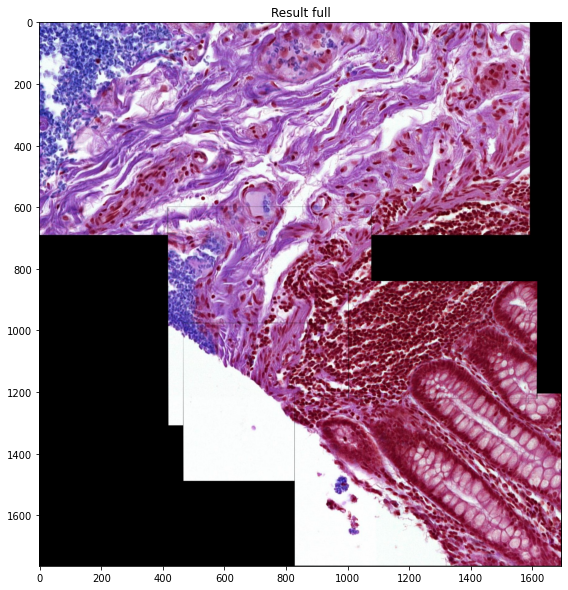

Raw matches (knn): 7006


<Figure size 1440x720 with 0 Axes>

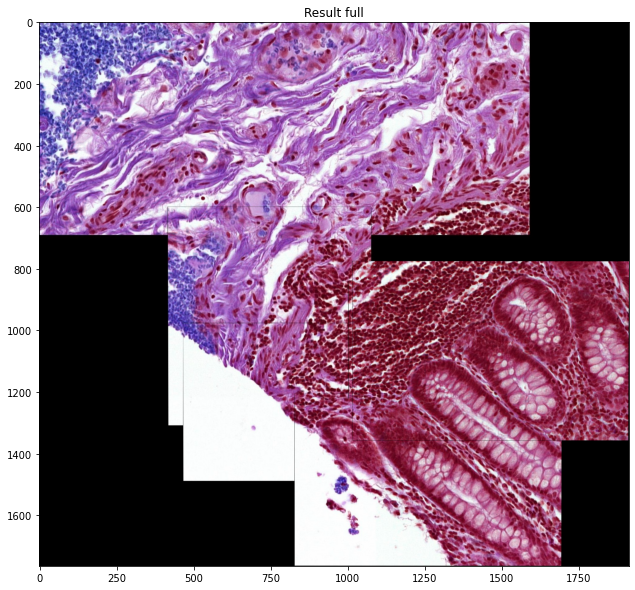

Raw matches (knn): 3722


<Figure size 1440x720 with 0 Axes>

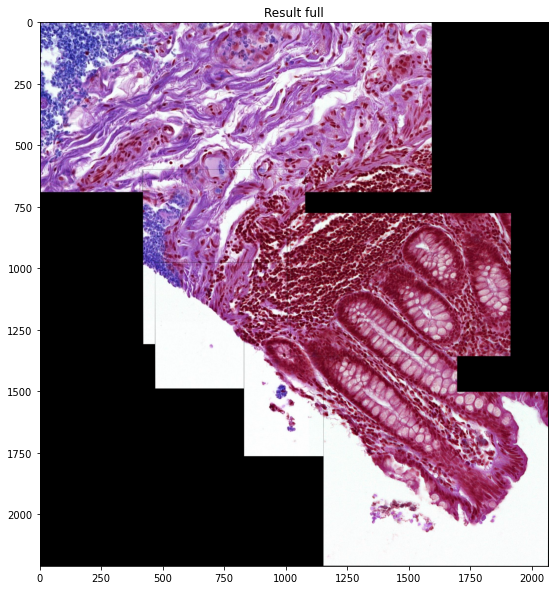

Raw matches (knn): 4298


<Figure size 1440x720 with 0 Axes>

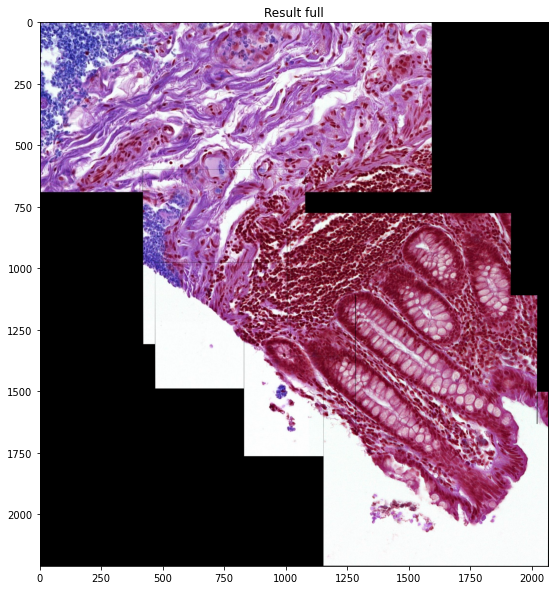

Raw matches (knn): 5790


<Figure size 1440x720 with 0 Axes>

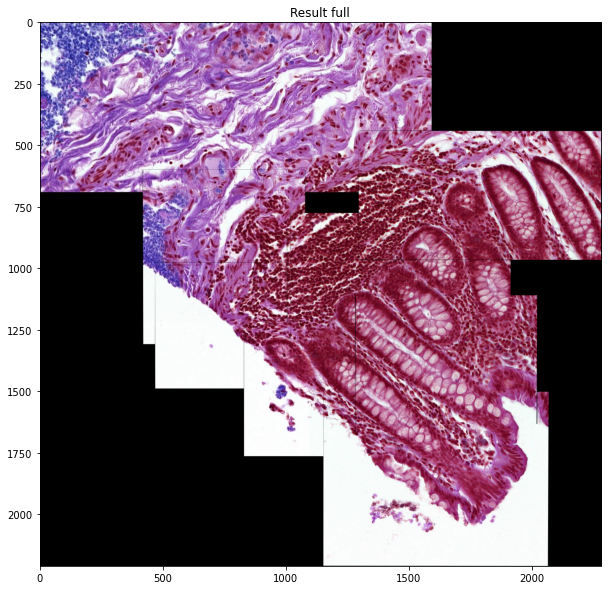

Raw matches (knn): 3277


<Figure size 1440x720 with 0 Axes>

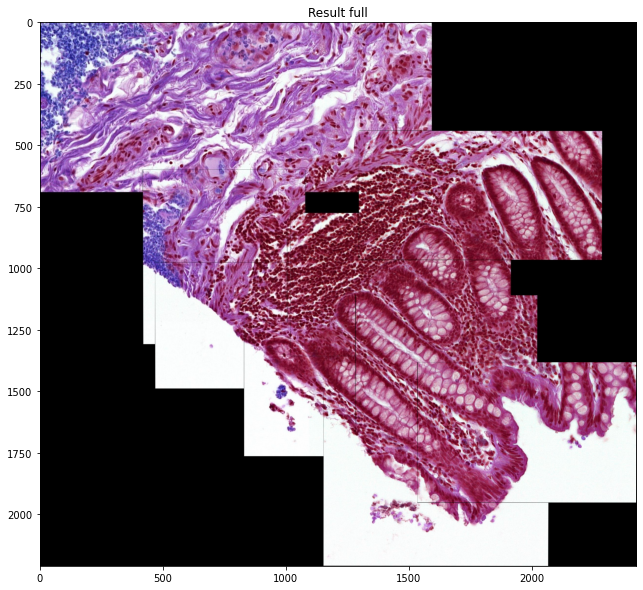

Raw matches (knn): 5138


<Figure size 1440x720 with 0 Axes>

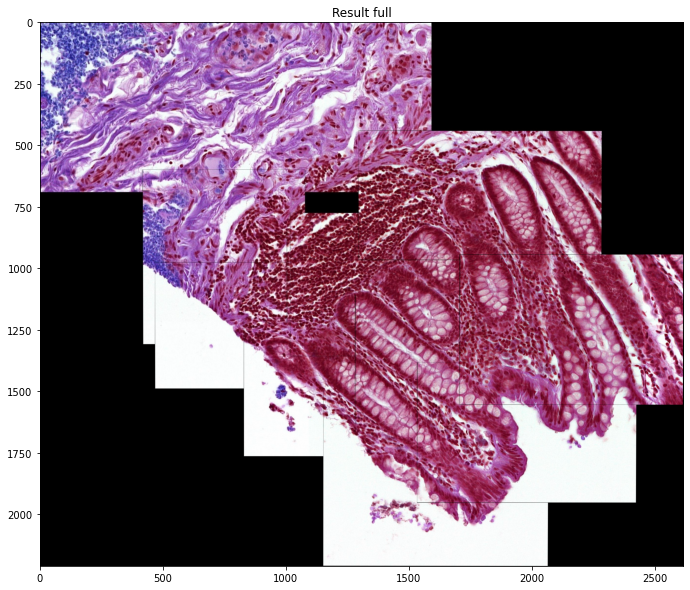

Raw matches (knn): 2401


<Figure size 1440x720 with 0 Axes>

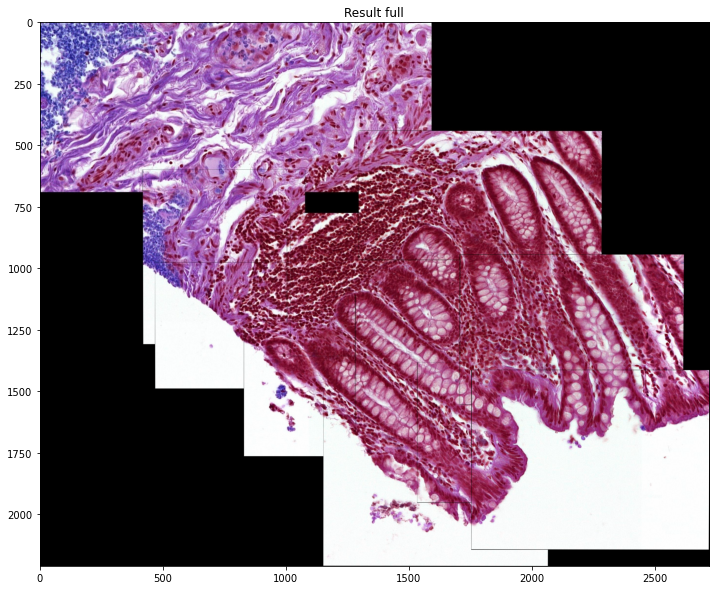

In [26]:
for i in range(1):
  for image_id in range(len(lista)):
    if image_id == 0 and i == 0:
      ImageStitching_without_show('r02.jpg', lista[image_id])
    else:
      ImageStitching_without_show(lista[image_id], 'result.jpg')

# Pobranie wyniku

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

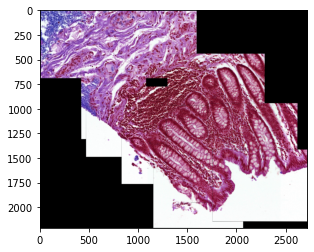

In [27]:
img = cv2.imread('result.jpg')
plt.imshow(img)
from google.colab import files
files.download('result.jpg') 

# Wynik

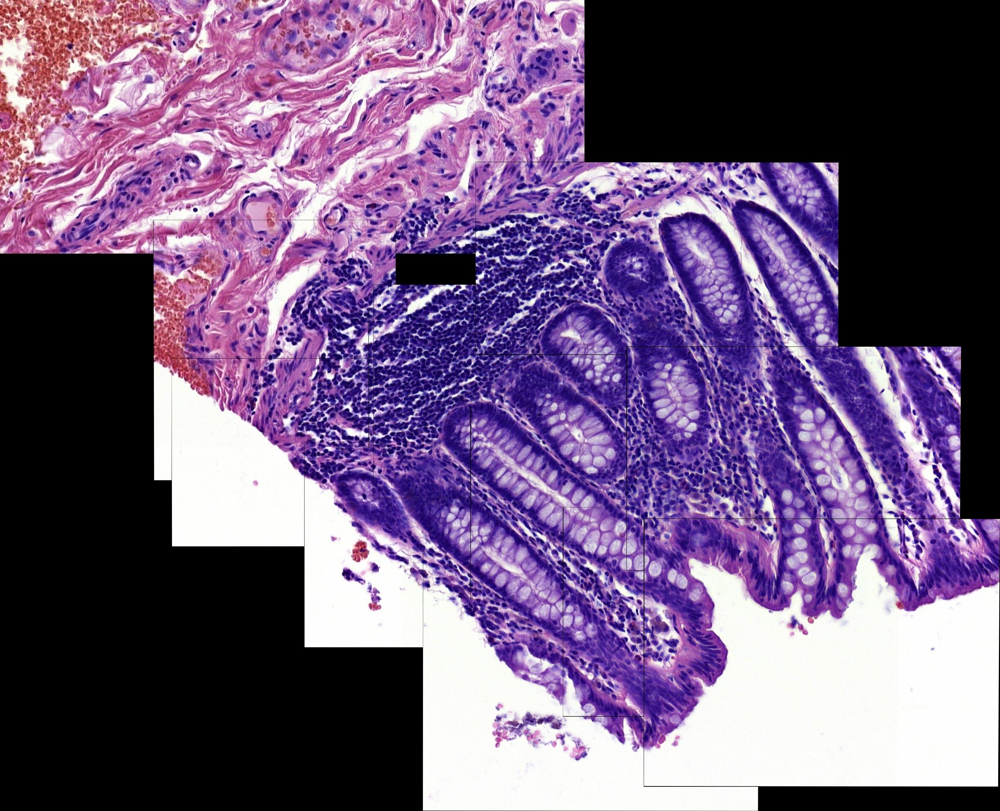